# Welch 2019 - Clustering
<div class="alert alert-warning">

**What this notebook does**
    
In this notebooke the previously normalized samples will be merged and batch corrected to visualize the full dataset of Welch et. al. Additionally, existing annotation and sample specific prefixes were added. This is the last step within the atlas processing.

IMPORTANT: When adding the old subtype labels, in Welch's subtype annotation file, two batches of cell identifiers have a different prefix. The majority of cell have "MD" as prefix, while two batches (6060 and 6063) have "Miami" as prefix. This fix was not performed in this file.

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering')

In [4]:
!ls data

agarwal_base_merge_base.h5ad  siletti_base_merge_BC.h5ad
agarwal_merge_base_BC.h5ad    smajic_base_merge_base.h5ad
altena_base_merge_base.h5ad   smajic_doublets_merge_base.h5ad
altena_merge_base_BC.h5ad     smajic_merge_base_BC.h5ad
siletti_base_merge_base.h5ad  welch_base_merge_base.h5ad


In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/4_clustering'

In [6]:
path='/home/hers_basak/jjiang/jack/outputs/deliverables/3_normalization/data/processed_'
suffix='base'

SN_MD5534a=f'{path}welch_{suffix}_SN_MD5534a.h5ad'
SN_MD5534b=f'{path}welch_{suffix}_SN_MD5534b.h5ad'
SN_MD5534c=f'{path}welch_{suffix}_SN_MD5534c.h5ad'
SN_MD5534d=f'{path}welch_{suffix}_SN_MD5534d.h5ad'
SN_MD5534e=f'{path}welch_{suffix}_SN_MD5534e.h5ad'
SN_MD5534f=f'{path}welch_{suffix}_SN_MD5534f.h5ad'
SN_MD5828a=f'{path}welch_{suffix}_SN_MD5828a.h5ad'
SN_MD5828b=f'{path}welch_{suffix}_SN_MD5828b.h5ad'
SN_MD5828c=f'{path}welch_{suffix}_SN_MD5828c.h5ad'
SN_MD5840a=f'{path}welch_{suffix}_SN_MD5840a.h5ad'
SN_MD5840b=f'{path}welch_{suffix}_SN_MD5840b.h5ad'
SN_MD5840c=f'{path}welch_{suffix}_SN_MD5840c.h5ad'
SN_MD5862a=f'{path}welch_{suffix}_SN_MD5862a.h5ad'
SN_MD5862b=f'{path}welch_{suffix}_SN_MD5862b.h5ad'
SN_MD5862c=f'{path}welch_{suffix}_SN_MD5862c.h5ad'
SN_MD5893a=f'{path}welch_{suffix}_SN_MD5893a.h5ad'
SN_MD5893b=f'{path}welch_{suffix}_SN_MD5893b.h5ad'
SN_MD5893c=f'{path}welch_{suffix}_SN_MD5893c.h5ad'
SN_MD6060a=f'{path}welch_{suffix}_SN_MD6060a.h5ad'
SN_MD6060b=f'{path}welch_{suffix}_SN_MD6060b.h5ad'
SN_MD6063a=f'{path}welch_{suffix}_SN_MD6063a.h5ad'
SN_MD6063b=f'{path}welch_{suffix}_SN_MD6063b.h5ad'
SN_MD6063c=f'{path}welch_{suffix}_SN_MD6063c.h5ad'

In [11]:
files = [SN_MD5534a,SN_MD5534b,SN_MD5534c,SN_MD5534d,SN_MD5534e,SN_MD5534f,SN_MD5828a,SN_MD5828b,SN_MD5828c,SN_MD5840a,SN_MD5840b,SN_MD5840c,SN_MD5862a,SN_MD5862b,SN_MD5862c,SN_MD5893a,SN_MD5893b,SN_MD5893c,SN_MD6060a,SN_MD6060b,SN_MD6063a,SN_MD6063b,SN_MD6063c]
names = ['SN_MD5534a','SN_MD5534b','SN_MD5534c','SN_MD5534d','SN_MD5534e','SN_MD5534f','SN_MD5828a','SN_MD5828b','SN_MD5828c','SN_MD5840a','SN_MD5840b','SN_MD5840c','SN_MD5862a','SN_MD5862b','SN_MD5862c','SN_MD5893a','SN_MD5893b','SN_MD5893c','SN_MD6060a','SN_MD6060b','SN_MD6063a','SN_MD6063b','SN_MD6063c']

object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i]+"_"+"preprocessed")
    locals()[object_names_merged[i]] = sc.read_h5ad(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_SN_MD5534a_preprocessed  is loaded
adata_SN_MD5534b_preprocessed  is loaded
adata_SN_MD5534c_preprocessed  is loaded
adata_SN_MD5534d_preprocessed  is loaded
adata_SN_MD5534e_preprocessed  is loaded
adata_SN_MD5534f_preprocessed  is loaded
adata_SN_MD5828a_preprocessed  is loaded
adata_SN_MD5828b_preprocessed  is loaded
adata_SN_MD5828c_preprocessed  is loaded
adata_SN_MD5840a_preprocessed  is loaded
adata_SN_MD5840b_preprocessed  is loaded
adata_SN_MD5840c_preprocessed  is loaded
adata_SN_MD5862a_preprocessed  is loaded
adata_SN_MD5862b_preprocessed  is loaded
adata_SN_MD5862c_preprocessed  is loaded
adata_SN_MD5893a_preprocessed  is loaded
adata_SN_MD5893b_preprocessed  is loaded
adata_SN_MD5893c_preprocessed  is loaded
adata_SN_MD6060a_preprocessed  is loaded
adata_SN_MD6060b_preprocessed  is loaded
adata_SN_MD6063a_preprocessed  is loaded
adata_SN_MD6063b_preprocessed  is loaded
adata_SN_MD6063c_preprocessed  is loaded


In [14]:
welch.obs['donor']

411276    SN_MD5534
411277    SN_MD5534
411278    SN_MD5534
411279    SN_MD5534
411280    SN_MD5534
            ...    
449855    SN_MD5893
449868    SN_MD5893
449877    SN_MD5893
449882    SN_MD5893
449885    SN_MD5893
Name: donor, Length: 21274, dtype: category
Categories (5, object): ['SN_MD5534', 'SN_MD5828', 'SN_MD5840', 'SN_MD5862', 'SN_MD5893']

In [13]:
prefix =names
for i in range(numberobj):
    locals()[object_names_merged[i]].obs_names= [prefix[i].replace('SN_','')+'_'+name if name[0]!='M' else name for name in locals()[object_names_merged[i]].obs_names ]

In [14]:
adata_SN_MD6063c_preprocessed.obs_names

Index(['MD6063c_TAGGCATCATTTGCTT-1', 'MD6063c_CGTCACTAGGTCGGAT-1',
       'MD6063c_GTGTTAGCAATGAATG-1', 'MD6063c_TAGACCAGTCTTCAAG-1',
       'MD6063c_CACACAACAATACGCT-1', 'MD6063c_TGACAACCAAGCCCAC-1',
       'MD6063c_TCACAAGTCGCTTAGA-1', 'MD6063c_ACTTTCAAGCGTGTCC-1',
       'MD6063c_AACCATGAGAAGATTC-1', 'MD6063c_TCACAAGCACATTCGA-1',
       ...
       'MD6063c_GGGCATCGTAAGTTCC-1', 'MD6063c_GTATTCTGTCTTTCAT-1',
       'MD6063c_AGCATACAGTGAACAT-1', 'MD6063c_GGGCACTAGACTGTAA-1',
       'MD6063c_CGCTATCAGTACATGA-1', 'MD6063c_TCAGGTATCAGGCCCA-1',
       'MD6063c_CGAGCCAGTTCGGCAC-1', 'MD6063c_CCATTCGTCTTGTACT-1',
       'MD6063c_GACTACAAGCCAGTAG-1', 'MD6063c_TGACTTTAGACTACAA-1'],
      dtype='object', length=5462)

## Merge
Observation prefixes/suffixes are sample specific, so to match the older atlas annotation we match their prefixes/suffixes.

In [26]:
old='/home/hers_basak/jjiang/jack/outputs/count_files/homo_sap/welch_2019/metadata/SN_human_7_ind_liger.annotation.csv'
locals()['old'] = sc.read_csv(old,first_column_names=True, dtype=str)
print('old h5ad file is loaded')

old h5ad file is loaded


In [20]:
adata_merge=ad.concat([adata_SN_MD5534a_preprocessed,adata_SN_MD5534b_preprocessed,adata_SN_MD5534c_preprocessed,adata_SN_MD5534d_preprocessed,adata_SN_MD5534e_preprocessed,adata_SN_MD5534f_preprocessed,adata_SN_MD5828a_preprocessed,adata_SN_MD5828b_preprocessed,adata_SN_MD5828c_preprocessed,adata_SN_MD5840a_preprocessed,adata_SN_MD5840b_preprocessed,adata_SN_MD5840c_preprocessed,adata_SN_MD5862a_preprocessed,adata_SN_MD5862b_preprocessed,adata_SN_MD5862c_preprocessed,adata_SN_MD5893a_preprocessed,adata_SN_MD5893b_preprocessed,adata_SN_MD5893c_preprocessed,adata_SN_MD6060a_preprocessed,adata_SN_MD6060b_preprocessed,adata_SN_MD6063a_preprocessed,adata_SN_MD6063b_preprocessed,adata_SN_MD6063c_preprocessed],  join="outer", fill_value=0)


In [43]:
adata_merge

AnnData object with n_obs × n_vars = 67467 × 33748
    obs: 'species', 'gender', 'instrument', 'technology', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    obsm: 'X_pca', 'X_umap'

In [35]:
subset_old = old[old.obs_names.isin(adata_merge.obs_names)]

In [38]:
subset_old.obs

""
MD5534a_TTCTCCTAGTGACATA-1
MD5534a_GCCTCTATCCGCATCT-1
MD5534a_ACACCAAGTACGAAAT-1
MD5534a_CTCAGAACACCTCGTT-1
MD5534a_GGGTTGCGTGTTGAGG-1
...
MD5862c_TGAAAGATCTTATCTG-1
MD5862c_TCTATTGTCCACGAAT-1
MD5862c_TTCGGTCCAATGAATG-1
MD5862c_CCATGTCGTTCGGCAC-1


In [44]:
adata_merge.obs[adata_merge.obs['total_counts']> 1200]

,species,gender,instrument,technology,atlas,sample,doublet_score,predicted_doublet,n_genes_by_counts,log1p_n_genes_by_counts,...,log1p_total_counts,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,n_genes,total_counts_mito,total_counts_norm
MD5534a_TGGTTCCGTCAACTGT-1,Homo sapien,female,Illumina NovaSeq 6000,10x_v2,welch,SN_MD5534a,0.020306,False,4300,8.366603,...,9.187993,3,1.386294,0.030587,118,4.779123,1.203100,4324,9808,9778
MD5534a_TTATGCTTCTGAAAGA-1,Homo sapien,female,Illumina NovaSeq 6000,10x_v2,welch,SN_MD5534a,0.016419,False,4385,8.386173,...,9.127176,2,1.098612,0.021657,85,4.454347,0.920411,4417,9235,9201
MD5534a_CGTTAGACAGATCGGA-1,Homo sapien,female,Illumina NovaSeq 6000,10x_v2,welch,SN_MD5534a,0.072063,False,3748,8.229244,...,8.913416,6,1.945910,0.080526,78,4.369448,1.046839,3763,7451,7430
MD5534a_TTGAACGAGTTCGCGC-1,Homo sapien,female,Illumina NovaSeq 6000,10x_v2,welch,SN_MD5534a,0.029076,False,3650,8.202756,...,8.778942,24,3.218876,0.367141,223,5.411646,3.411351,3668,6537,6495
MD5534a_TAAGCGTAGATATACG-1,Homo sapien,female,Illumina NovaSeq 6000,10x_v2,welch,SN_MD5534a,0.126494,False,3227,8.079618,...,8.755265,13,2.639057,0.204403,93,4.543295,1.462264,3231,6360,6343
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MD6063c_TCGTACCGTTCCGGCA-1,Homo sapien,male,Illumina NovaSeq 6000,10x_v2,welch,SN_MD6063c,0.034495,False,829,6.721426,...,7.095064,15,2.772589,1.229508,9,2.302585,0.737705,829,1220,1205
MD6063c_CGAGCCACAAGGTGTG-1,Homo sapien,male,Illumina NovaSeq 6000,10x_v2,welch,SN_MD6063c,0.099266,False,923,6.828712,...,7.102499,5,1.791759,0.409836,29,3.401197,2.377049,924,1220,1214
MD6063c_GACAGAGGTTCCTCCA-1,Homo sapien,male,Illumina NovaSeq 6000,10x_v2,welch,SN_MD6063c,0.032749,False,901,6.804615,...,7.098376,4,1.609438,0.329489,49,3.912023,4.036244,902,1214,1209
MD6063c_GATCGTATCGGAGGTA-1,Homo sapien,male,Illumina NovaSeq 6000,10x_v2,welch,SN_MD6063c,0.045032,False,894,6.796824,...,7.092574,21,3.091042,1.717089,25,3.258097,2.044154,894,1223,1202


In [39]:
original_celltype =list()
except_counter=0
for obs_name in adata_merge.obs_names:
    try:
        value= np.where(subset_old.obs_names ==obs_name)[0][0]
        original_celltype.append(subset_old.X[value,0])
    except:
        except_counter+=1
        original_celltype.append('None')

In [40]:
set(original_celltype)

{'"ASTRO"',
 '"ASTROfos"',
 '"ASTROgfap"',
 '"ENDOfibro"',
 '"ENDOmural"',
 '"ENDOstalk"',
 '"MG"',
 '"MGfos"',
 '"MGmp"',
 '"NEUROdop"',
 '"NEUROex1"',
 '"NEUROinh1"',
 '"NEUROinh2"',
 '"NEUROinh3"',
 '"NEUROinh4"',
 '"NEUROinh5"',
 '"OLIGO1"',
 '"OLIGO2"',
 '"OLIGO3"',
 '"OLIGO4"',
 '"OLIGO5"',
 '"OPC1"',
 '"OPC2"',
 'None'}

In [41]:
print(except_counter)

46193


In [45]:
adata_merge.obs['original_celltype']= original_celltype

In [46]:
adata_merge.write(os.path.join('./data/welch_base_merge_base.h5ad'))


## All data

In [6]:
object_names_merged = ['adata_welch_merge']
names = ['welch_merge']
path='/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering/data'
files=[f'{path}/welch_base_merge_base.h5ad']

numberobj=1
for i in range(numberobj):
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_welch_merge  is loaded


pca again

In [7]:
#To make reproducible plots
np.random.seed(41)

In [8]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

welch_merge


In [9]:
nn= 15 #default 15
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_merged[i]])

welch_merge


welch_merge


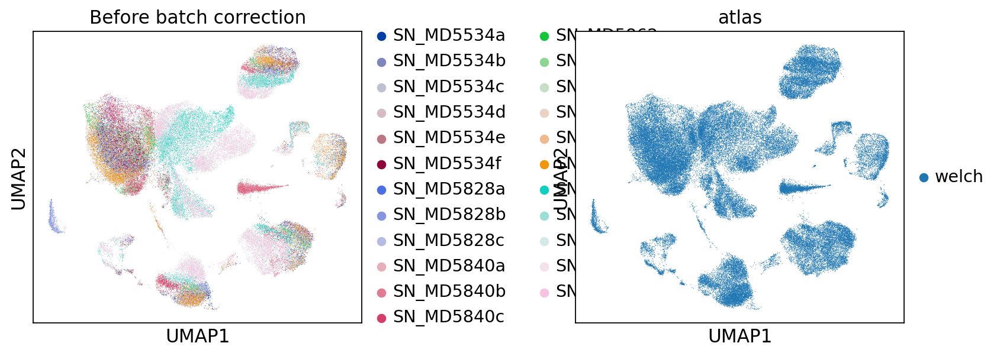

In [10]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged[i]],color=['sample', 'atlas'], wspace=0.5,s=1, title='Before batch correction')

In [47]:
adata_welch_merge

AnnData object with n_obs × n_vars = 67467 × 33748
    obs: 'species', 'gender', 'instrument', 'technology', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_celltype'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors', 'atlas_colors', 'gender_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

welch_merge


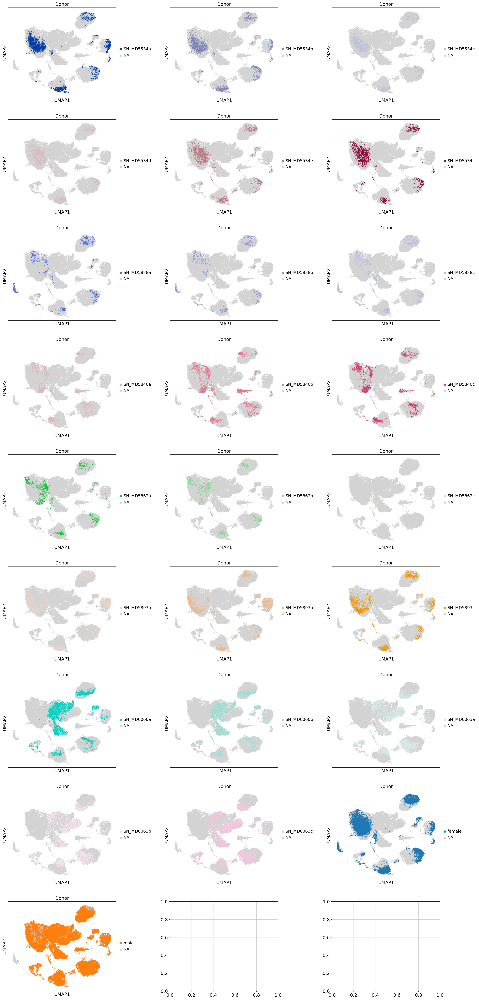

In [44]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(9, 3, figsize = [24,56])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5534a', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5534b', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5534c', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5534d', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5534e', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5534f', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5828a', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5828b', use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5828c', use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5840a', use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5840b', use_raw=False, s=10, ax= axs[3,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5840c', use_raw=False, s=10, ax= axs[3,2],show=False, title=title1)
    
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5862a', use_raw=False, s=10, ax= axs[4,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5862b', use_raw=False, s=10, ax= axs[4,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5862c', use_raw=False, s=10, ax= axs[4,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5893a', use_raw=False, s=10, ax= axs[5,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5893b', use_raw=False, s=10, ax= axs[5,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD5893c', use_raw=False, s=10, ax= axs[5,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD6060a', use_raw=False, s=10, ax= axs[6,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD6060b', use_raw=False, s=10, ax= axs[6,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD6063a', use_raw=False, s=10, ax= axs[6,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD6063b', use_raw=False, s=10, ax= axs[7,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SN_MD6063c', use_raw=False, s=10, ax= axs[7,1],show=False, title=title1)
    
    sc.pl.umap(locals()[object_names_merged[i]], color='gender',groups='female', use_raw=False, s=10, ax= axs[7,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color='gender',groups='male', use_raw=False, s=10, ax= axs[8,0],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_subplots.png',bbox_inches='tight')

welch_merge


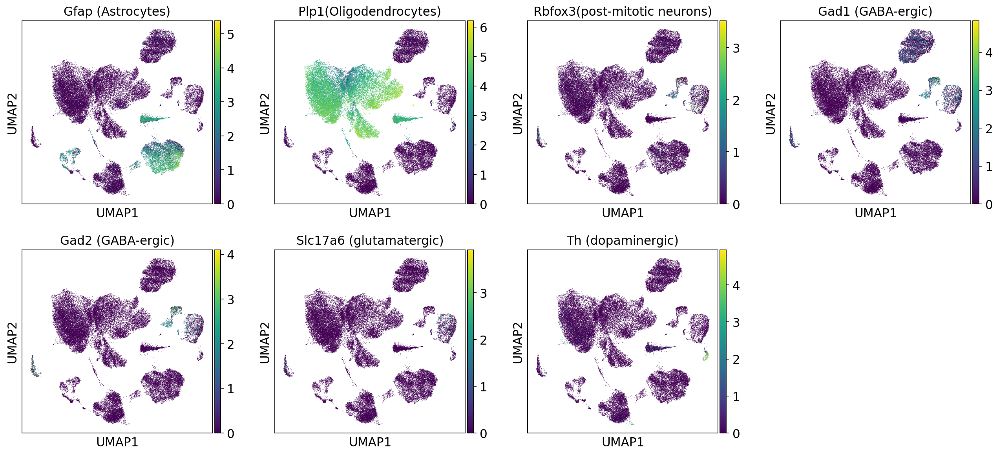

In [26]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_merged[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_merged[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','TH'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=1, save=f'/{names[i]}_subplots_markers.png')
    else:
        sc.pl.umap(locals()[object_names_merged[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [65]:
object_names_merged_BC=list()

for i in range(numberobj):
    object_names_merged_BC.append("adata"+"_"+names[i]+"_"+"full_BC")
    locals()[object_names_merged_BC[i]] = locals()[object_names_merged[i]].copy()
    print(object_names_merged_BC[i],' is loaded')

adata_welch_merge_full_BC  is loaded


Forgot to make a donor annotation grouping the samples

In [66]:
donor = [d[:-1] for d in adata_welch_merge_full_BC.obs['sample']]
adata_welch_merge_full_BC.obs['donor']=donor

In [67]:
adata_welch_merge_full_BC.obs['donor']

MD5534a_TGGTTCCGTCAACTGT-1    SN_MD5534
MD5534a_TTATGCTTCTGAAAGA-1    SN_MD5534
MD5534a_CGTTAGACAGATCGGA-1    SN_MD5534
MD5534a_TTGAACGAGTTCGCGC-1    SN_MD5534
MD5534a_TAAGCGTAGATATACG-1    SN_MD5534
                                ...    
MD6063c_TCAGGTATCAGGCCCA-1    SN_MD6063
MD6063c_CGAGCCAGTTCGGCAC-1    SN_MD6063
MD6063c_CCATTCGTCTTGTACT-1    SN_MD6063
MD6063c_GACTACAAGCCAGTAG-1    SN_MD6063
MD6063c_TGACTTTAGACTACAA-1    SN_MD6063
Name: donor, Length: 67467, dtype: object

In [68]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged_BC[i]], svd_solver='arpack')

welch_merge


In [78]:
for i in range(numberobj):
    print(names[i])
    sc.external.pp.harmony_integrate(locals()[object_names_merged_BC[i]], key =['donor'])

welch_merge


2023-09-23 15:51:47,534 - harmonypy - INFO - Iteration 1 of 10
2023-09-23 15:52:12,679 - harmonypy - INFO - Iteration 2 of 10
2023-09-23 15:52:37,029 - harmonypy - INFO - Iteration 3 of 10
2023-09-23 15:53:01,695 - harmonypy - INFO - Iteration 4 of 10
2023-09-23 15:53:26,732 - harmonypy - INFO - Iteration 5 of 10
2023-09-23 15:53:51,251 - harmonypy - INFO - Iteration 6 of 10
2023-09-23 15:54:15,585 - harmonypy - INFO - Iteration 7 of 10
2023-09-23 15:54:40,186 - harmonypy - INFO - Iteration 8 of 10
2023-09-23 15:55:02,515 - harmonypy - INFO - Iteration 9 of 10
2023-09-23 15:55:27,619 - harmonypy - INFO - Iteration 10 of 10
2023-09-23 15:55:49,962 - harmonypy - INFO - Stopped before convergence


welch_merge


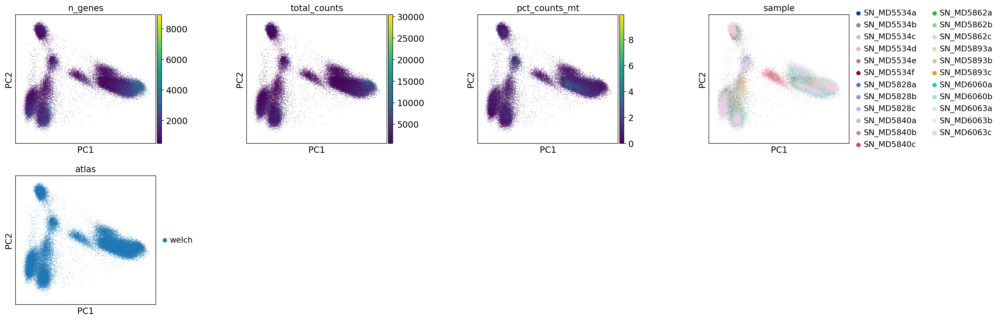

In [79]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]], color=['n_genes', 'total_counts', 'pct_counts_mt', 'sample', 'atlas'],wspace=0.5)


welch_merge


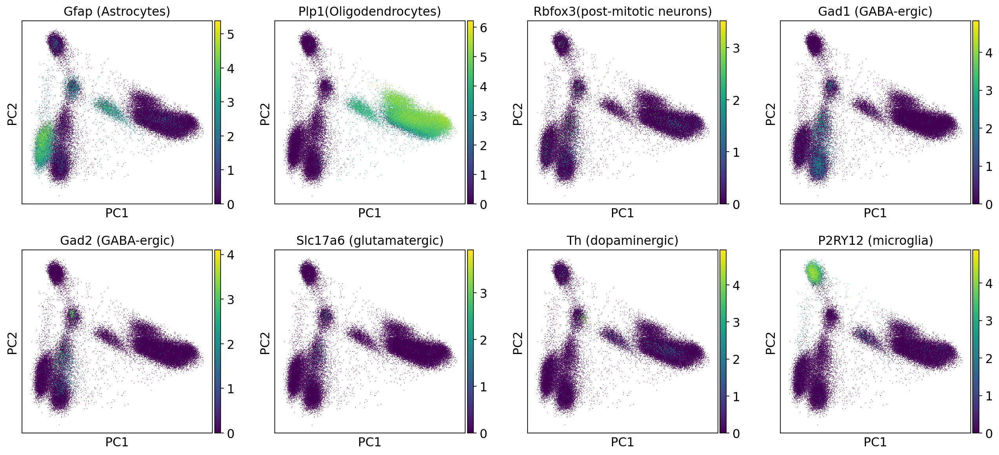

In [80]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]],use_raw=False, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

In [81]:
nn=40
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged_BC[i]], n_neighbors=nn, n_pcs=50,use_rep='X_pca_harmony')
    sc.tl.umap(locals()[object_names_merged_BC[i]])
    

welch_merge


welch_merge


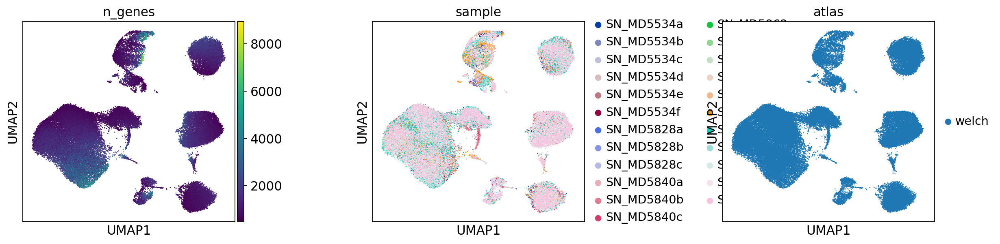

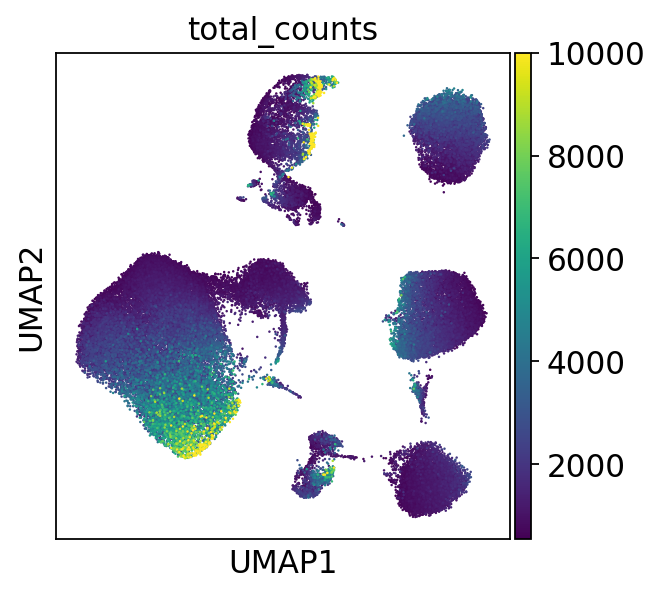

In [82]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['n_genes','sample', 'atlas'], 
               use_raw=False, s=5, wspace=0.5)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='total_counts', vmax=10000,
               use_raw=False, s=5, wspace=0.5)
    

welch_merge


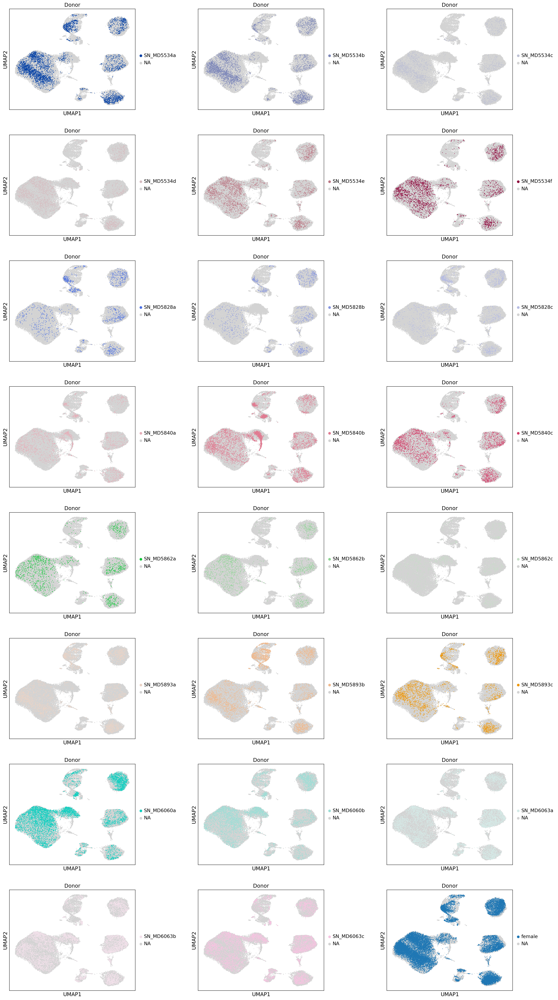

In [83]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(8, 3, figsize = [24,48])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5534a', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5534b', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5534c', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5534d', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5534e', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5534f', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5828a', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5828b', use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5828c', use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5840a', use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5840b', use_raw=False, s=10, ax= axs[3,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5840c', use_raw=False, s=10, ax= axs[3,2],show=False, title=title1)
    
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5862a', use_raw=False, s=10, ax= axs[4,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5862b', use_raw=False, s=10, ax= axs[4,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5862c', use_raw=False, s=10, ax= axs[4,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5893a', use_raw=False, s=10, ax= axs[5,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5893b', use_raw=False, s=10, ax= axs[5,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD5893c', use_raw=False, s=10, ax= axs[5,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD6060a', use_raw=False, s=10, ax= axs[6,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD6060b', use_raw=False, s=10, ax= axs[6,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD6063a', use_raw=False, s=10, ax= axs[6,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD6063b', use_raw=False, s=10, ax= axs[7,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SN_MD6063c', use_raw=False, s=10, ax= axs[7,1],show=False, title=title1)
    
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='gender',groups='female', use_raw=False, s=10, ax= axs[7,2],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_subplots.png',bbox_inches='tight')

welch_merge


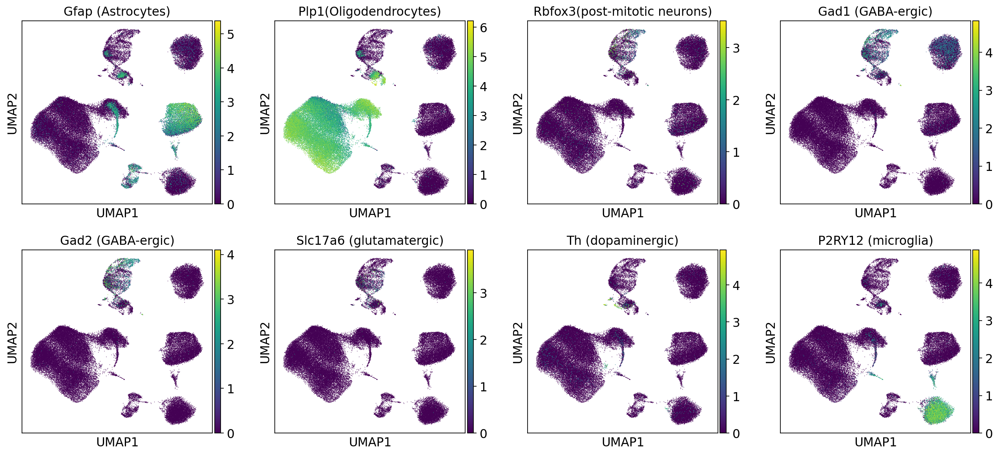

In [84]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],use_raw=False,title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

welch_merge


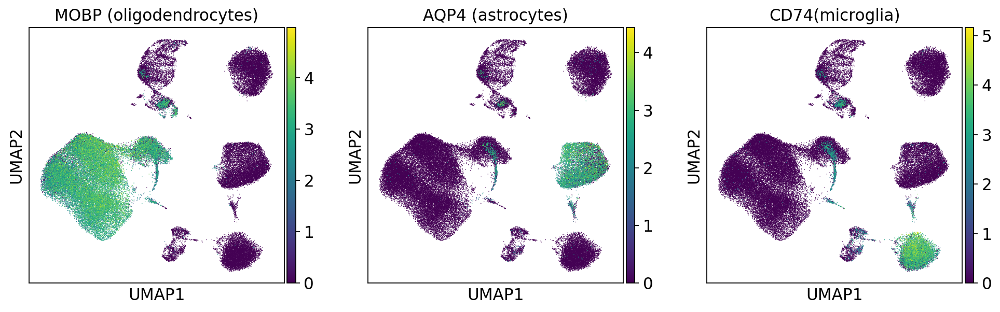

In [85]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['MOBP','AQP4', 'CD74' ],use_raw=False,title=['MOBP (oligodendrocytes)','AQP4 (astrocytes)','CD74(microglia)'])

In [86]:
locals()[object_names_merged_BC[i]]

AnnData object with n_obs × n_vars = 67467 × 33748
    obs: 'species', 'gender', 'instrument', 'technology', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_celltype', 'donor'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors', 'atlas_colors', 'gender_colors'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

welch_merge


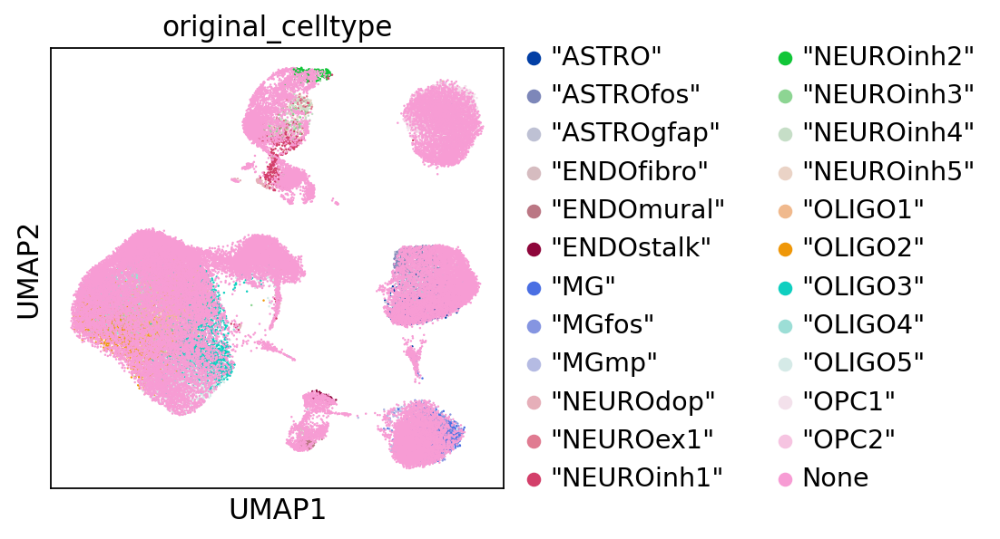

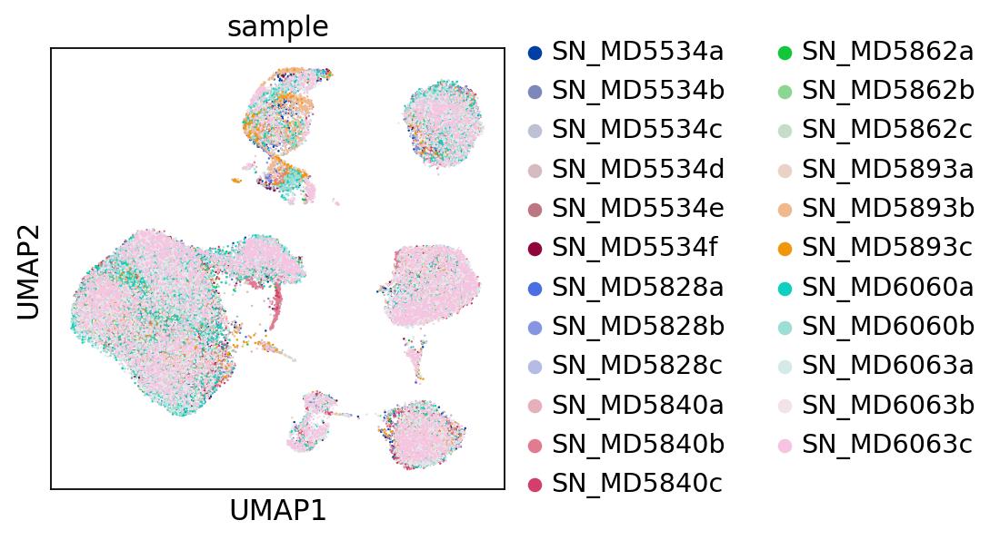

In [87]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='original_celltype', 
               use_raw=False, s=5, wspace=0.5, save='/welch_og_celltype.png')
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='sample', 
               use_raw=False, s=5, wspace=0.5, save='/welch_sample.png')

In [88]:
adata_welch_merge_full_BC.write(os.path.join('./data/welch_merge_base_BC.h5ad'))
